# Importer TACO ✅

In [26]:
#Importer TACO

#TODO : launch with python function calls? Or de we stay with notebook launch for downloads? Since it's full terminal calls?

def dl_taco_dataset():
    # clone repo, install requirements
    !git clone https://github.com/pedropro/TACO.git
    %cd ./TACO
    !pip install -r requirements.txt

    # replace download.py for a paralellized + functional version from pr
    !rm ./download.py
    !git checkout 94031c21be6c6a9db247bf8284a55c96c21cfcf9 download.py

    # launch download
    !python download.py

    # get back to precedent directory
    %cd ..

In [27]:
dl_taco_dataset()

Cloning into 'TACO'...
remote: Enumerating objects: 740, done.
remote: Counting objects: 100% (160/160), done.
remote: Compressing objects: 100% (72/72), done.
remote: Total 740 (delta 117), reused 128 (delta 88), pack-reused 580
Receiving objects: 100% (740/740), 98.70 MiB | 22.81 MiB/s, done.
Resolving deltas: 100% (494/494), done.
/home/xaelee/Documents/datasetManipulation/Notebooks/TACO


/home/xaelee/Documents/default/lib/python3.11/site-packages/IPython/core/magics/osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


DEPRECATION: Loading egg at /home/xaelee/Documents/default/lib/python3.11/site-packages/pycocotools-2.0-py3.11-linux-x86_64.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation.. Discussion can be found at https://github.com/pypa/pip/issues/12330
Updated 1 path from fbf41fb
Note. If for any reason the connection is broken. Just call me again and I will start where I left.
Finished. The dataset is available under data :) 1500
/home/xaelee/Documents/datasetManipulation/Notebooks


In [24]:
def delete_TACO_dataset():
    !rm -rf ./TACO/

In [25]:
delete_TACO_dataset()

In [2]:
import random
import pylab
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
%matplotlib inline

from PIL import Image, ExifTags
from pycocotools.coco import COCO
from matplotlib.patches import Polygon, Rectangle
from matplotlib.collections import PatchCollection
import colorsys

/var/tmp/ipykernel_106375/636116907.py:5: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [22]:
def display_test_image_seg_TACO():
    
    dataset_path = './TACO/data'
    anns_file_path = dataset_path + '/' + 'annotations.json'
    
    # Read annotations
    with open(anns_file_path, 'r') as f:
        dataset = json.loads(f.read())

    categories = dataset['categories']
    anns = dataset['annotations']
    imgs = dataset['images']
    
    #select image
    image_filepath = 'batch_1/000014.jpg'
    pylab.rcParams['figure.figsize'] = (28,28)


    # Obtain Exif orientation tag code
    for orientation in ExifTags.TAGS.keys():
        if ExifTags.TAGS[orientation] == 'Orientation':
            break

    # Loads dataset as a coco object
    coco = COCO(anns_file_path)

    # Find image id
    img_id = -1
    for img in imgs:
        if img['file_name'] == image_filepath:
            img_id = img['id']
            break

    # Show image and corresponding annotations
    if img_id == -1:
        print('Incorrect file name')
    else:

        # Load image
        print(image_filepath)
        I = Image.open(dataset_path + '/' + image_filepath)

        # Load and process image metadata
        if I._getexif():
            exif = dict(I._getexif().items())
            # Rotate portrait and upside down images if necessary
            if orientation in exif:
                if exif[orientation] == 3:
                    I = I.rotate(180,expand=True)
                if exif[orientation] == 6:
                    I = I.rotate(270,expand=True)
                if exif[orientation] == 8:
                    I = I.rotate(90,expand=True)

        # Show image
        fig,ax = plt.subplots(1)
        plt.axis('off')
        plt.imshow(I)

        # Load mask ids
        annIds = coco.getAnnIds(imgIds=img_id, catIds=[], iscrowd=None)
        anns_sel = coco.loadAnns(annIds)

        # Show annotations
        for ann in anns_sel:
            color = colorsys.hsv_to_rgb(np.random.random(),1,1)
            for seg in ann['segmentation']:
                poly = Polygon(np.array(seg).reshape((int(len(seg)/2), 2)))
                p = PatchCollection([poly], facecolor=color, edgecolors=color,linewidths=0, alpha=0.4)
                ax.add_collection(p)
                p = PatchCollection([poly], facecolor='none', edgecolors=color, linewidths=2)
                ax.add_collection(p)
            [x, y, w, h] = ann['bbox']
            rect = Rectangle((x,y),w,h,linewidth=2,edgecolor=color,
                             facecolor='none', alpha=0.7, linestyle = '--')
            ax.add_patch(rect)

        plt.show()


loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
batch_1/000014.jpg


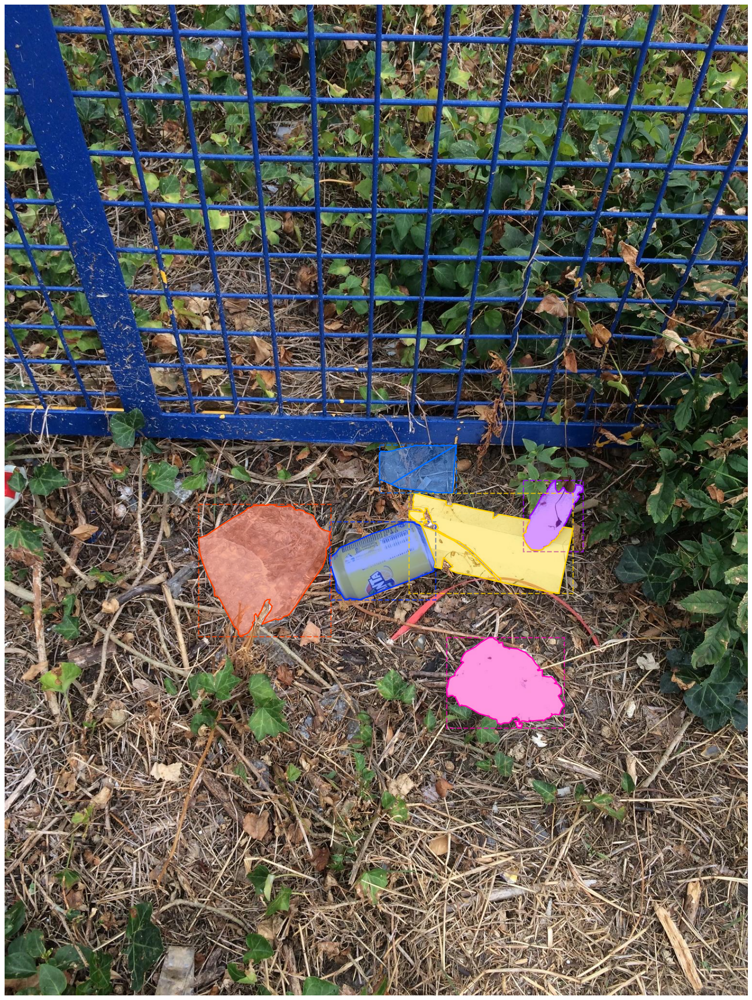

In [23]:
display_test_image_seg_TACO()